In [1]:
%matplotlib inline
import scipy.io.wavfile as wav


import IPython

import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from numpy.linalg import inv


from scipy import stats
from scipy.stats import norm, gamma
from scipy.stats import distributions
import scipy
from scipy.stats import multivariate_normal

In [2]:
from scipy.io import wavfile
(Fs_Ed, src_Ed) = wav.read("Ed_Murrow.wav")
(Fs_Blade, src_Blade) = wav.read("Blade_Runner.wav")

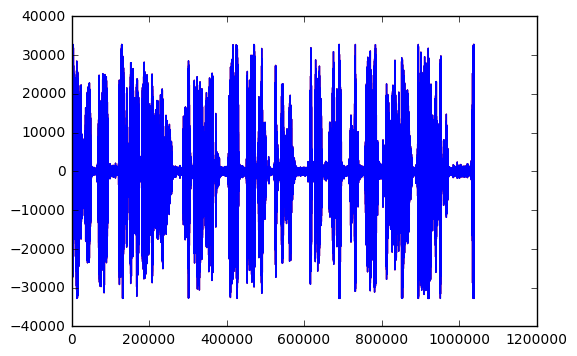

In [3]:
plt.plot(src_Ed[:,0],color = 'r')
plt.plot(src_Ed[:,1])

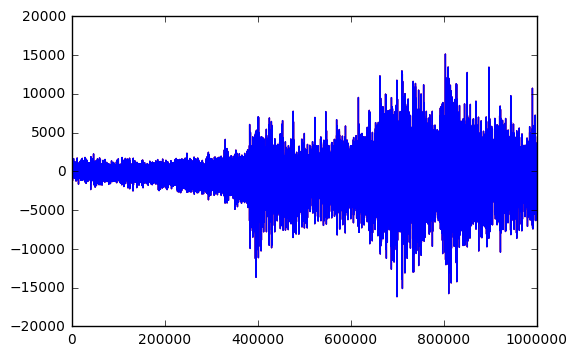

In [4]:

plt.plot(src_Blade[:,0],color = 'r')
plt.plot(src_Blade[:,0])

In [ ]:
src_Ed.shape

In [5]:
IPython.display.Audio("Ed_Murrow.wav")

In [6]:
IPython.display.Audio("Blade_Runner.wav")

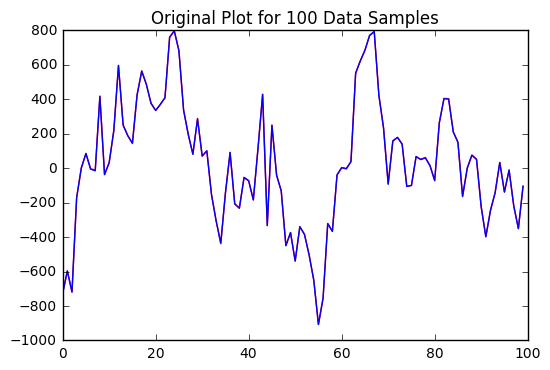

In [57]:
interval = 10
sample_Ed = src_Ed[100000:101000:10]
index = np.arange(100000,101000,10)
plt.plot(sample_Ed[:,0],color = 'r')
plt.plot(sample_Ed[:,1])
plt.title('Original Plot for 100 Data Samples')

In [58]:
N = 100
sample1_Ed = sample_Ed[:,0]
var_sample1_Ed = np.var(sample1_Ed)
SNR = 15
var_sample1_Ed_noise = var_sample1_Ed/(10**(SNR/10))

# add gaussian noises at a 15dB level
noise = np.random.normal(0,np.sqrt(var_sample1_Ed_noise),N)
sample1_Ed_with_noise  = sample1_Ed + noise

max_sample1_Ed = np.max(sample1_Ed)

sample1_Ed_with_noise[10:20] =  sample1_Ed_with_noise[10:20] + 0.8*max_sample1_Ed



## Ed_Murrow

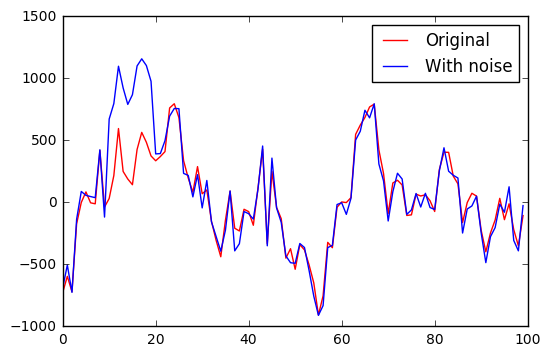

In [59]:

axis = np.arange(0,100,1)
plt.plot(axis,sample1_Ed,color = 'r',label='Original')
plt.plot(axis,sample1_Ed_with_noise,label = 'With noise')
plt.legend()
plt.show()

In [60]:
def kernel(x,y,sig):
    k = np.exp(-(x-y)**2./(2*sig**2))
    return k

In [61]:
def regression(C,sig):
    x = np.zeros(N)
    for i in range(len(index)):
        x[i] = index[i]/Fs_Ed

    Ker = np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            Ker[i,j] = kernel(x[i],x[j],sig)
    
    I = np.identity(N)
    theta = np.linalg.inv(Ker + C*I) .dot(sample1_Ed_with_noise)
    #theta = np.linalg.inv(Ker + C*I) .dot(sample1_Ed_with_noise)
    
    return theta,x,Ker

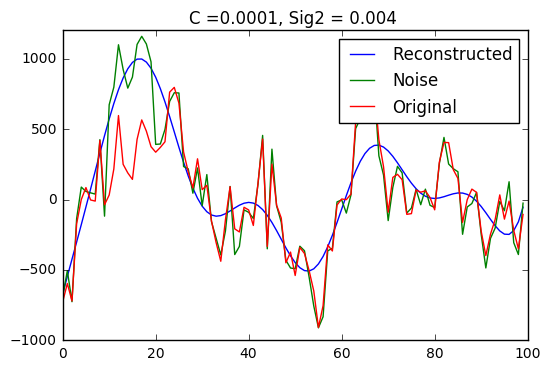

In [62]:
C = 0.0001
sig2 = 0.004
theta,x,ker = regression(C,sig2)
y = theta.T .dot(ker)
plt.plot(y,label = 'Reconstructed')
plt.plot(sample1_Ed_with_noise,color = 'g',label='Noise')
plt.plot(sample1_Ed,color = 'r',label = 'Original')
plt.ylim(-1000,1200)
plt.title('C =0.0001, Sig2 = 0.004 ')
plt.legend()
plt.show()



<font color = "blue">
## Comment

As shown above, the reconstructed plot 

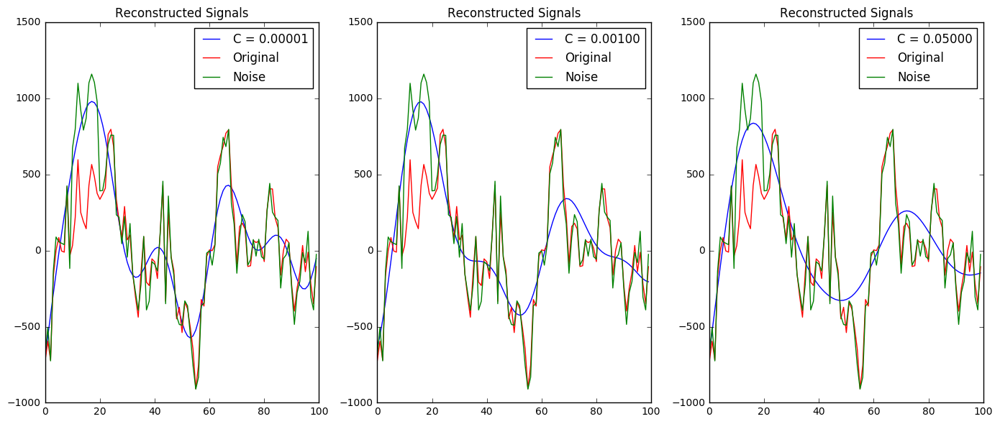

In [65]:
C = [0.00001,0.001,0.05]
sig1 = 0.004
theta_list1 = []
y_list1 = []
for i in range(len(C)):
    t2,x2,Ker2 = regression(C[i],sig1)
    theta_list1.append(t2)
    y_list1.append(theta_list1[i].T .dot(Ker2))

fig, axes = plt.subplots(1, len(C), figsize=(14,6))
plt.title('Reconstructed Signals')
axes = axes.ravel()

for i in range(len(C)):   
    axes[i].set_title('Reconstructed Signals')
    axes[i].plot(y_list1[i],label = 'C = %.5f'%C[i] )   
    axes[i].plot(sample_Ed[:,0],color = 'r',label='Original')
    axes[i].plot(sample1_Ed_with_noise,color = 'g',label='Noise')
    axes[i].legend()    


plt.tight_layout() 


<font color = "blue">
### Comment
When the regularization parameter C increases, the reconstructed plot looks smoother. 


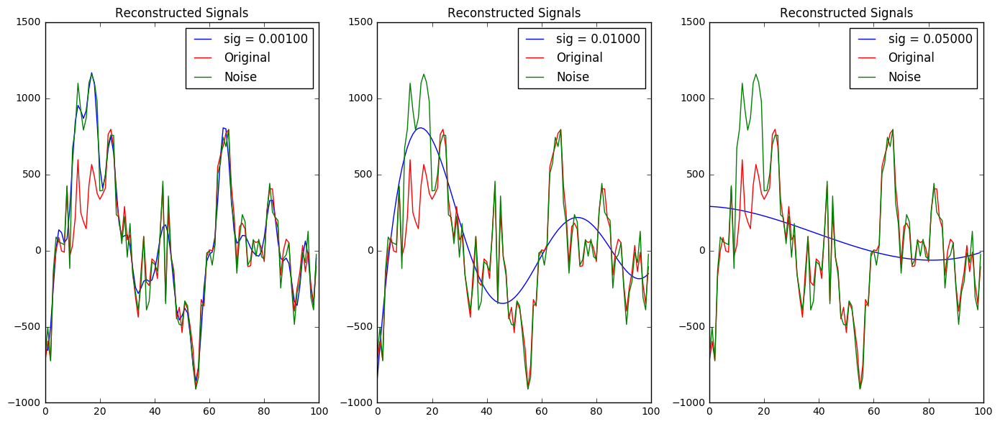

In [67]:
sig = [0.001,0.01,0.05]
C2 = 0.0001
theta_list2 = []
y_list1 = []

for i in range(len(sig)):
    t3,x3,Ker3 = regression(C2,sig[i])
    theta_list2.append(t3)
    y_list1.append(theta_list2[i].T .dot(Ker3))



fig, axes = plt.subplots(1, len(C), figsize=(14,6))
plt.title('Reconstructed Signals')
axes = axes.ravel()

for i in range(len(C)):   
    axes[i].set_title('Reconstructed Signals')
    axes[i].plot(y_list1[i],label = 'sig = %.5f'%sig[i] )   
    axes[i].plot(sample_Ed[:,0],color = 'r',label='Original')
    axes[i].plot(sample1_Ed_with_noise,color = 'g',label='Noise')    
    axes[i].legend()   
plt.tight_layout() 
#plt.plot(theta_list1[0],label = 'C=%f'%C[i])



<font color = "blue">
### Comment
When the regularization parameter sigma increases, the reconstructed plot looks smoother. When sig = 0.001 (small), the reconstructed plot seems overfitting. When sig = 0.05 (large), the reconstructed plot seems underfitting. By comparing the 3 plots, sig = 0.01 is the best case.


## Blade （Same procedure）

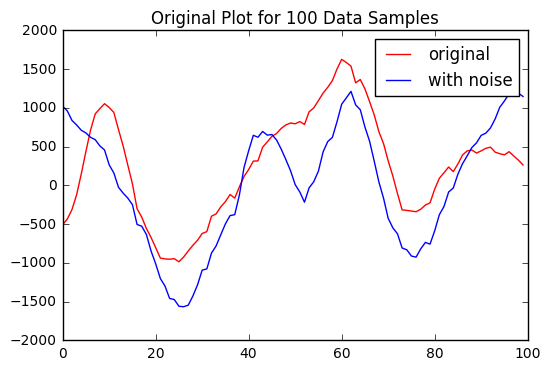

In [68]:
interval = 10
sample_Blade = src_Blade[100000:101000:10]
plt.plot(sample_Blade[:,0],color = 'r',label = 'original')
plt.plot(sample_Blade[:,1],label = 'with noise')
plt.title('Original Plot for 100 Data Samples')
plt.legend()
plt.show()


N = 100
sample1_Blade = sample_Blade[:,0]
var_sample1_Blade = np.var(sample1_Blade)
SNR = 15
var_sample1_Blade_noise = var_sample1_Blade/(10**(SNR/10))

# add gaussian noises at a 15dB level
noise = np.random.normal(0,np.sqrt(var_sample1_Blade_noise),N)
sample1_Blade_with_noise  = sample1_Blade + noise
max_sample1_Blade = np.max(sample1_Blade)
sample1_Blade_with_noise[10:20] =  sample1_Blade_with_noise[10:20] + 0.8*max_sample1_Blade




In [69]:
def regression(C,sig):
    x = np.zeros(N)
    for i in range(len(index)):
        x[i] = index[i]/Fs_Ed

    Ker = np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            Ker[i,j] = kernel(x[i],x[j],sig)
    
    I = np.identity(N)
    theta = np.linalg.inv(Ker + C*I) .dot(sample1_Blade_with_noise)
    #theta = np.linalg.inv(Ker + C*I) .dot(sample1_Ed_with_noise)
    
    return theta,x,Ker

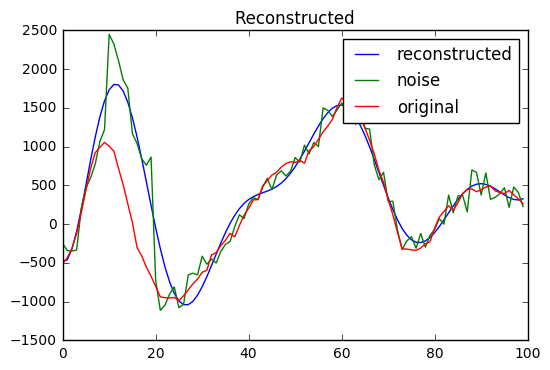

In [70]:
C = 0.0001
sig2 = 0.004
theta1,x,ker = regression(C,sig2)
y = theta1 .dot(ker)
plt.plot(y,label = 'reconstructed')
plt.plot(sample1_Blade_with_noise,label = 'noise')
plt.plot(sample1_Blade,label = 'original')
plt.legend()
plt.title('Reconstructed')

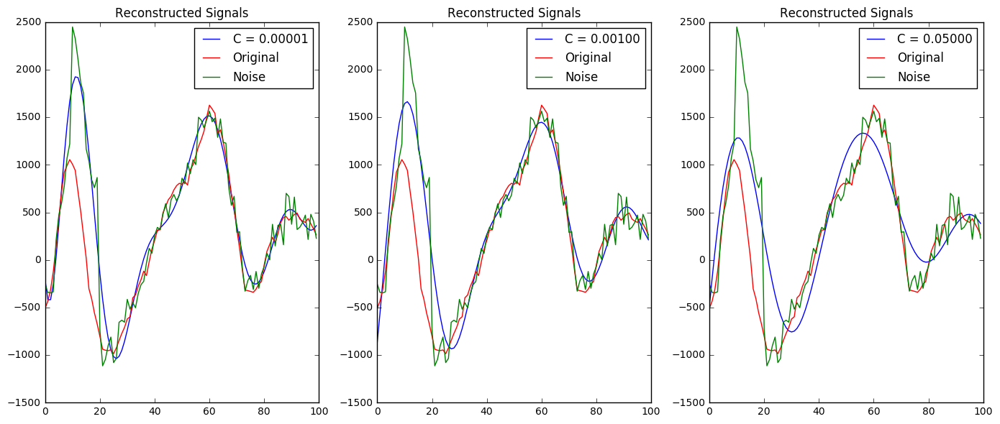

In [74]:
C = [0.00001,0.001,0.05]
sig1 = 0.004
theta_list1 = []
y_list1 = []
for i in range(len(C)):
    t2,x2,Ker2 = regression(C[i],sig1)
    theta_list1.append(t2)
    y_list1.append(theta_list1[i].T .dot(Ker2))

fig, axes = plt.subplots(1, len(C), figsize=(14,6))
plt.title('Reconstructed Signals')
axes = axes.ravel()

for i in range(len(C)):   
    axes[i].set_title('Reconstructed Signals')
    axes[i].plot(y_list1[i],label = 'C = %.5f'%C[i] )   
    axes[i].plot(sample1_Blade,color = 'r',label='Original')
    axes[i].plot(sample1_Blade_with_noise,color = 'g',label='Noise') 
    axes[i].legend()    


plt.tight_layout() 


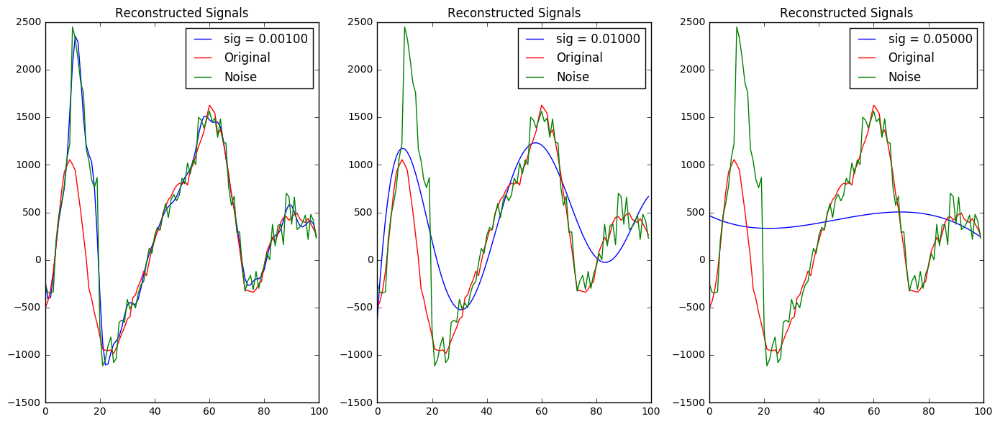

In [72]:
sig = [0.001,0.01,0.05]
C2 = 0.0001
theta_list2 = []
y_list1 = []

for i in range(len(sig)):
    t3,x3,Ker3 = regression(C2,sig[i])
    theta_list2.append(t3)
    y_list1.append(theta_list2[i].T .dot(Ker3))



fig, axes = plt.subplots(1, len(C), figsize=(14,6))
plt.title('Reconstructed Signals')
axes = axes.ravel()

for i in range(len(C)):   
    axes[i].set_title('Reconstructed Signals')
    axes[i].plot(y_list1[i],label = 'sig = %.5f'%sig[i] )   
    axes[i].plot(sample1_Blade,color = 'r',label='Original')
    axes[i].plot(sample1_Blade_with_noise,color = 'g',label='Noise')    
    axes[i].legend()   
plt.tight_layout() 
#plt.plot(theta_list1[0],label = 'C=%f'%C[i])



## Comment


In [39]:
%matplotlib inline
import json
import pandas as pd
import numpy as np
from numpy.linalg import inv
from collections import OrderedDict
import matplotlib.pyplot as plt


In [40]:
d_1992_T2N= json.load(open('Time2NextEr1992.json'), object_pairs_hook=OrderedDict)
d_1992_DUR = json.load(open('PrevErDur1992.json'), object_pairs_hook=OrderedDict)
d_2010_T2N = json.load(open('Time2NextEr2010.json'), object_pairs_hook=OrderedDict)
d_2010_DUR = json.load(open('PrevErDur2010.json'), object_pairs_hook=OrderedDict)

In [41]:
#d_1992_T2N_year = [v for v in d_1992_T2N.keys()]
d_1992_T2N_value = [v for v in d_1992_T2N.values()]
d_1992_DUR_value = [v for v in d_1992_DUR.values()]
#d_1992_T2N_dur_year = [v for v in d_1992_DUR.keys()]
#len(d_1992_T2N_dur)
#x_1992 = np.zeros((2,))
x1992_list = []
y1992_list = []
for i in range(len(d_1992_DUR_value)):
    for j in range(len(d_1992_DUR_value[i])):
        x1992_list.append(d_1992_DUR_value[i][j])
        
for i in range(len(d_1992_T2N_value)):
    for j in range(len(d_1992_T2N_value[i])):
        y1992_list.append(d_1992_T2N_value[i][j])

sample_1992 = np.zeros((2,len(y1992_list)))
sample_1992[0,:] = x1992_list
sample_1992[1,:] = y1992_list


d_2010_DUR_value = [v for v in d_2010_T2N.values()]
d_2010_T2N_value = [v for v in d_2010_DUR.values()]
x2010_list = []
y2010_list = []
for i in range(len(d_2010_DUR_value)):
    for j in range(len(d_2010_DUR_value[i])):
        x2010_list.append(d_2010_DUR_value[i][j])
        
for i in range(len(d_2010_T2N_value)):
    for j in range(len(d_2010_T2N_value[i])):
        y2010_list.append(d_2010_T2N_value[i][j])

sample_2010 = np.zeros((2,len(y2010_list)))
sample_2010[0,:] = y2010_list
sample_2010[1,:] = x2010_list


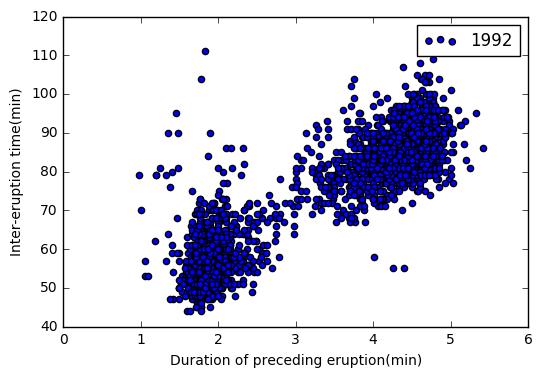

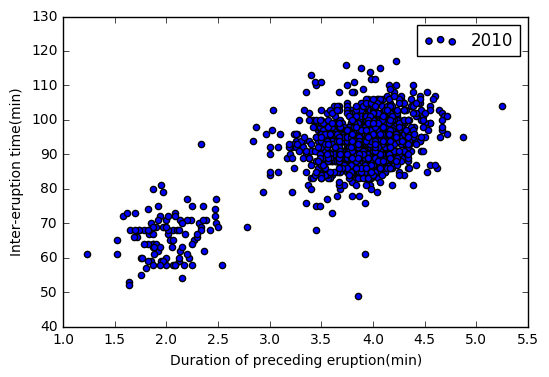

In [42]:
plt.scatter(sample_1992[0,:],sample_1992[1,:],label = '1992')
plt.ylabel('Inter-eruption time(min)')
plt.xlabel('Duration of preceding eruption(min)')
plt.legend()
plt.show()

plt.scatter(sample_2010[0,:],sample_2010[1,:],label = '2010')
plt.ylabel('Inter-eruption time(min)')
plt.xlabel('Duration of preceding eruption(min)')
plt.legend()
plt.show()

In [45]:
def fun1_a1b1(x,p,N):
    M = 0 
    for i in range(N):
        M+=p[i] * x[0,:][i] * x[1,:][i]
    return M

def fun1_a1b11(x,p,N):
    M = 0 
    for i in range(N):
        M+=p[i] * x[0,:][i] * x[0,:][i]
    return M


def fun1_a0b0(x,p,N):
    M = 0 
    for i in range(N):
        M+= (1 - p[i]) * x[0,:][i] * x[1,:][i]
    return M


def fun1_a0b00(x,p,N):
    M = 0 
    for i in range(N):
        M+= (1-p[i]) * x[0,:][i] * x[0,:][i]
    return M


def fun1_sig1(x,p,a,b,N):
    M = 0
    for i in range(N):
        M+= p[i]*(x[1,:][i] - a*x[0,:][i] - b)**2
    return M

def fun1_sig0(x,p,a,b,N):
    M = 0
    for i in range(N):
        M+= (1-p[i])*(x[1,:][i] - a*x[0,:][i] - b)**2
    return M

def pi_update(ab1,ab0,x,PI,N,sig0,sig1):
    A = np.zeros(N)
    m = 0
    for i in range(N):
        a = norm.pdf(x[1,:][i], loc= ab1[0]*x[0,:][i] + ab1[1], scale=np.sqrt(sig1)) * PI
      
        b = PI * norm.pdf(x[1,:][i], loc= ab1[0]*x[0,:][i] + ab1[1], scale=np.sqrt(sig1)) + (1-PI) * norm.pdf(x[1,:][i], loc= ab0[0]*x[0,:][i] + ab0[1], scale=np.sqrt(sig0))
        m += np.log(b)
        A[i] = a/b
    return A,m

In [52]:
N = len(sample_1992[0,:])
ite = 100

a0_ini = 30
b0_ini = 1
a1_ini = 30
b1_ini = 1
sig20_ini = 10
sig21_ini = 10


pi = np.zeros((ite,N))
#pi[0,:] = initial_pi
PI = np.zeros((ite))
ab1 = np.zeros((ite,2))
ab0 = np.zeros((ite,2))

sig20 = np.zeros((ite,1))
sig21 = np.zeros((ite,1))

sig20[0] = sig20_ini
sig21[0] = sig21_ini
ab1[0,0] = a1_ini
ab1[0,1] = b1_ini
ab0[0,0] = a0_ini
ab0[0,1] = b0_ini
PI[0] = 0.9
m = np.zeros(ite)
pi[0,:],m[0] = pi_update(ab1[0,:],ab0[0,:],sample_1992,PI[0],N,sig20[0,:],sig21[0,:] )


for i in range(1,ite):
    PI[i] = np.sum(pi[i-1,:])/N
    
    ab11 = pi[i-1,:] .dot (sample_1992[0,:])
    ab22 = np.sum(pi[i-1,:] )
    ab111 = fun1_a1b11(sample_1992, pi[i-1,:],N)
   
    coef1 = np.zeros((2,2))
    coef1[0,0] = ab111
    coef1[0,1] = coef1[1,0] = ab11
    coef1[1,1] = ab22
    
    coef2 = np.zeros(2)
    coef2[0] = fun1_a1b1(sample_1992, pi[i-1,:],N)
    coef2[1] = pi[i-1,:] .dot (sample_1992[1,:])
    
    ab1[i,:] = inv(coef1) .dot(coef2)
    #print(coef1,coef2)
    #print ('\n')
    ##print(ab1[i,:])
    one_arr = np.ones(N)
    ab011 = (one_arr - pi[i-1,:]).dot (sample_1992[0,:])
    ab022 = np.sum(one_arr - pi[i-1,:] )
    ab000 = fun1_a0b00(sample_1992, pi[i-1,:],N)
    
    coef01 = np.zeros((2,2))
    
    coef01[0,0] = ab000
    coef01[0,1] = coef01[1,0] = ab011
    coef01[1,1] = ab022
    
    
    coef02 = np.zeros(2)
    coef02[0] = fun1_a0b0(sample_1992, pi[i-1,:],N)
    coef02[1] = (one_arr - pi[i-1,:]) .dot (sample_1992[1,:])
   
    ab0[i,:] = inv(coef01) .dot(coef02)
    
    sig21[i,:] = fun1_sig1(sample_1992,pi[i-1,:],ab1[i,:][0],ab1[i,:][1],N)/np.sum(pi[i-1,:])
    sig20[i,:] = fun1_sig0(sample_1992,pi[i-1,:],ab0[i,:][0],ab0[i,:][1],N)/np.sum(one_arr - pi[i-1,:])
    
    pi[i,:],m[i] = pi_update(ab1[i,:],ab0[i,:],sample_1992,PI[i],N,sig20[i,:],sig21[i,:] )
    #print(pi[i,:])
    
    
    
    
    
    
    
    
    

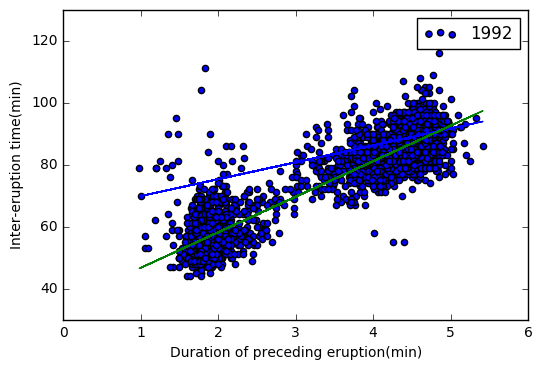

In [53]:
a1_em = ab1[-1][0]
b1_em = ab1[-1][1]
a0_em = ab0[-1][0]
b0_em = ab0[-1][1]
y0 = []
y1 = []
for i in range(N):
    y0.append(a0_em*sample_1992[0,i] + b0_em)
    y1.append(a1_em*sample_1992[0,i] + b1_em)
    

    
plt.plot(sample_1992[0,:],y0)
plt.plot(sample_1992[0,:],y1)  
plt.scatter(sample_1992[0,:],sample_1992[1,:],label = '1992')
plt.ylabel('Inter-eruption time(min)')
plt.xlabel('Duration of preceding eruption(min)')
plt.legend()
plt.show()


## Plot the log likelihood 

(0, 10)

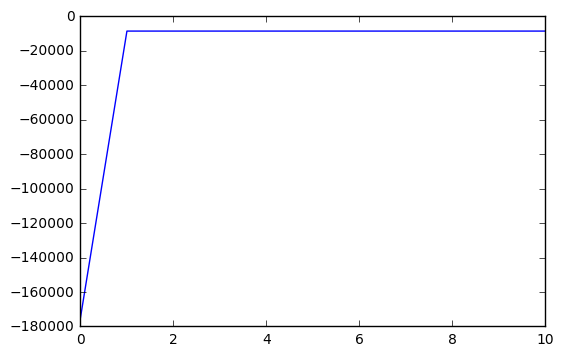

In [56]:
plt.plot(m)
plt.xlim(0,10)

In [48]:
N = len(sample_2010[0,:])
ite = 200

a0_ini = 22
b0_ini = 1
a1_ini = 30
b1_ini = 1
sig20_ini = 10
sig21_ini = 10





pi = np.zeros((ite,N))
#pi[0,:] = initial_pi
PI = np.zeros((ite))
ab1 = np.zeros((ite,2))
ab0 = np.zeros((ite,2))

sig20 = np.zeros((ite,1))
sig21 = np.zeros((ite,1))

sig20[0] = sig20_ini
sig21[0] = sig21_ini
ab1[0,0] = a1_ini
ab1[0,1] = b1_ini
ab0[0,0] = a0_ini
ab0[0,1] = b0_ini
PI[0] = 0.9
m = np.zeros(ite)
pi[0,:],m[0] = pi_update(ab1[0,:],ab0[0,:],sample_2010,PI[0],N,sig20[0,:],sig21[0,:] )
pi

for i in range(1,ite):
    PI[i] = np.sum(pi[i-1,:])/N
    
    ab11 = pi[i-1,:] .dot (sample_2010[0,:])
    ab22 = np.sum(pi[i-1,:] )
    ab111 = fun1_a1b11(sample_2010, pi[i-1,:],N)
   
    coef1 = np.zeros((2,2))
    coef1[0,0] = ab111
    coef1[0,1] = coef1[1,0] = ab11
    coef1[1,1] = ab22
    
    coef2 = np.zeros(2)
    coef2[0] = fun1_a1b1(sample_2010, pi[i-1,:],N)
    coef2[1] = pi[i-1,:] .dot (sample_2010[1,:])
    
    ab1[i,:] = inv(coef1) .dot(coef2)
    #print(coef1,coef2)
    #print ('\n')
    ##print(ab1[i,:])
    one_arr = np.ones(N)
    ab011 = (one_arr - pi[i-1,:]).dot (sample_2010[0,:])
    ab022 = np.sum(one_arr - pi[i-1,:] )
    ab000 = fun1_a0b00(sample_2010, pi[i-1,:],N)
    
    coef01 = np.zeros((2,2))
    
    coef01[0,0] = ab000
    coef01[0,1] = coef01[1,0] = ab011
    coef01[1,1] = ab022
    
    
    coef02 = np.zeros(2)
    coef02[0] = fun1_a0b0(sample_2010, pi[i-1,:],N)
    coef02[1] = (one_arr - pi[i-1,:]) .dot (sample_2010[1,:])
   
    ab0[i,:] = inv(coef01) .dot(coef02)
   # print(coef02)
    
    sig21[i,:] = fun1_sig1(sample_2010,pi[i-1,:],ab1[i,:][0],ab1[i,:][1],N)/np.sum(pi[i-1,:])
    sig20[i,:] = fun1_sig0(sample_2010,pi[i-1,:],ab0[i,:][0],ab0[i,:][1],N)/np.sum(one_arr - pi[i-1,:])
    
    pi[i,:],m[i] = pi_update(ab1[i,:],ab0[i,:],sample_2010,PI[i],N,sig20[i,:],sig21[i,:] )
    #print(pi[i,:])
    
    
    
    
    
    
    
    
    

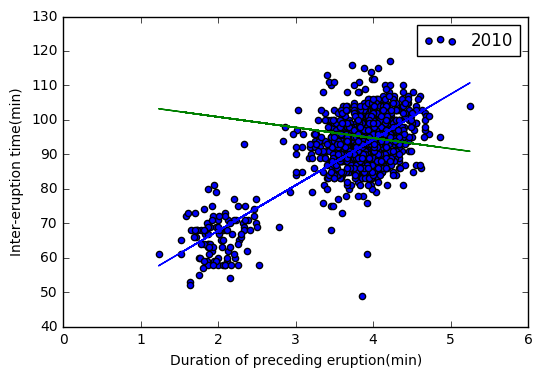

In [50]:
a1_em = ab1[-1][0]
b1_em = ab1[-1][1]
a0_em = ab0[-1][0]
b0_em = ab0[-1][1]
y0 = []
y1 = []
for i in range(N):
    y0.append(a0_em*sample_2010[0,i] + b0_em)
    y1.append(a1_em*sample_2010[0,i] + b1_em)
    

    
plt.plot(sample_2010[0,:],y0)
plt.plot(sample_2010[0,:],y1)  
plt.scatter(sample_2010[0,:],sample_2010[1,:],label = '2010')
plt.ylabel('Inter-eruption time(min)')
plt.xlabel('Duration of preceding eruption(min)')
plt.legend()
plt.show()

## Plot the log likelihood 

(0, 10)

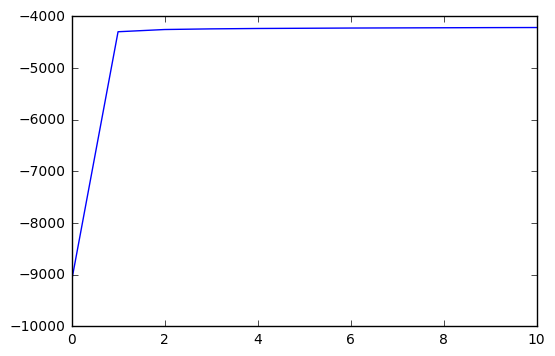

In [51]:
plt.plot(m)
plt.xlim(0,10)